In [1]:
import sys
import os
# Add the directory containing 'thesis_utils.py' to the system path
sys.path.append(os.path.abspath('..'))  # If 'thesis_utils.py' is one level up
# Or use this if it's in the same directory as the notebook:
# sys.path.append(os.getcwd())
# os.environ["JULIA_NUM_THREADS"] = "8" 
os.environ["PYTHON_JULIACALL_HANDLE_SIGNALS"] = "yes"
os.environ["PYTHON_JULIACALL_THREADS"] = "auto"
os.environ["PYTHON_JULIACALL_OPTLEVEL"] = "3"
from pysr import PySRRegressor
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
from sdmetrics.single_column import KSComplement

from thesis_utils import *

Detected IPython. Loading juliacall extension. See https://juliapy.github.io/PythonCall.jl/stable/compat/#IPython


In [57]:
import importlib
import thesis_utils  # or whatever your module is called

importlib.reload(thesis_utils)

from thesis_utils import *

In [2]:
data = pd.read_csv("../../data/air_quality/air_quality_cleaned.csv")
data = data.dropna()
# sub sampling due to degrading performance with too large datasets in denoising and SR
# data_sample = data.sample(n=9600, random_state=42)

In [3]:
# Generate the profiling report
profile_full = ProfileReport(data, title="Air", explorative=True)

# Display the report in the notebook
profile_full.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 14/14 [00:00<00:00, 319.59it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [3]:
# variable assignment according to correlation structure
independents_lst = ['AH', 'PT08.S4(NO2)', 'RH']
dependent_var = 'T'
X = data[independents_lst].to_numpy()
y = data[dependent_var].to_numpy()

316**2 * RBF(length_scale=20) + WhiteKernel(noise_level=0.0456)


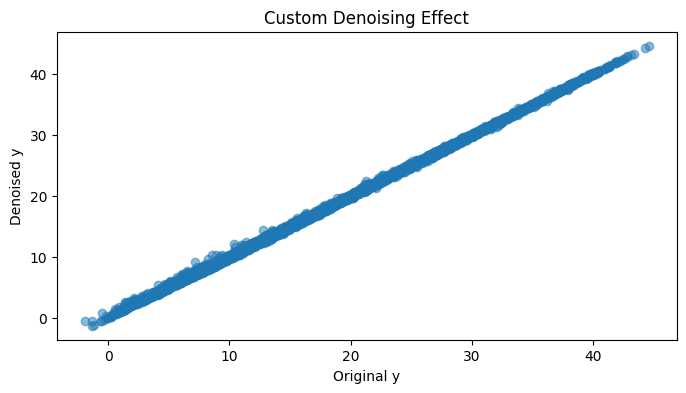

In [5]:
%matplotlib inline
y_denoised = bound_denoise(X, y, length_scale_bounds=(1e-3, 20), noise_level_bounds=(1e-5, 0.05), show_denoising_effect=True)

In [8]:
data_denoised = data.copy()
data_denoised['T'] = y_denoised
data_denoised.to_csv('data/air_quality_cleaned_denoised.csv', index=False)

In [9]:
sr_model = PySRRegressor(
        niterations=1024,  # Number of iterations to search for equations
        binary_operators=["+", "-", "*", "/"],
        unary_operators=["log", "abs", "sqrt"],
        maxdepth=10,
        elementwise_loss="loss(x, y) = (x - y)^2",  # Define loss function (mean squared error)
        verbosity=0,
        maxsize=50
    )
sr_model.fit(X, y_denoised)

PySRRegressor.equations_ = [
	    pick         score                                           equation  \
	0         0.000000e+00                                          17.755495   
	1         2.688597e-01                                     x0 * 17.525475   
	2         7.845540e-01                               (728.7423 / x2) * x0   
	3         7.306687e-01               1011.30756 / ((x2 / x0) + 10.093816)   
	4         1.555241e+00  (2390.1536 / ((x2 / x0) + 34.04592)) + -10.908732   
	5         2.035581e-07  abs(2390.1536 / ((x2 / x0) + 34.04592)) + -10....   
	6         2.898447e-03  (2393.5422 / (((x2 + -0.12003765) / x0) + 34.1...   
	7         4.898433e-02  (2497.7542 / (((x2 / x0) + 36.64567) - (18.653...   
	8         3.950878e-01  (x2 / (x0 / -0.047810625)) + (x0 * (1431.0137 ...   
	9   >>>>  3.582497e-02  (x2 / (x0 / -0.058509544)) + (((1257.066 / ((x...   
	10        6.261315e-03  (((x0 * 1257.0713) / (x2 + (x0 * 19.10671))) -...   
	11        3.077642e-02  (x2 / ((x0 / -0.06639962) - (x1 / 2548.5254)))...   
	12        3.436064e-02  ((x2 / ((x0 / -0.0670765) - (x1 / 1691.4391)))...   
	13        1.904165e-03  (x0 * ((1203.3274 / (x2 + (x0 * 18.276379))) -...   
	14        8.494189e-04  (x0 * ((1203.3116 / ((x0 * 18.317204) + x2)) -...   
	15        1.834785e-02  ((2.8298266 - (x2 * (((x1 / (x0 / -3.276177e-6...   
	16        2.680857e-03  ((((x0 * 1206.7756) / ((x0 * 18.148685) + x2))...   
	17        2.199466e-02  (x2 / (x0 / -0.0750779)) + (2.0642831 + (((x0 ...   
	18        2.297294e-02  (x0 * (1263.5973 / ((x0 * 19.083038) + x2))) +...   
	19        1.731579e-02  ((x0 / ((x0 * 19.164833) + x2)) * 1263.5958) +...   
	20        1.694698e-03  (((x2 + 1.5565765) / (x0 / -0.07870641)) + 2.3...   
	21        1.284701e-03  ((((x2 + 1.5600019) / (x0 / -0.07887377)) + ((...   
	22        5.811974e-03  ((((x0 / ((x0 * 19.163286) + x2)) * 1263.5958)...   
	23        5.295012e-03  (((x0 / ((x0 * 19.152811) + x2)) * 1263.596) +...   
	24        1.491447e-04  (((x0 / ((x0 * 19.152811) + x2)) * 1263.596) +...   
	25        1.145159e-02  (((x2 + 1.0560616) / (x0 / -0.0765448)) + (2.1...   
	26        2.367984e-03  (((x2 + 1.0173433) / (x0 / -0.077600546)) + 2....   
	
	         loss  complexity  
	0   78.134125           1  
	1   45.636482           3  
	2    9.502923           5  
	3    2.203974           7  
	4    0.098252           9  
	5    0.098252          10  
	6    0.097968          11  
	7    0.088825          13  
	8    0.040306          15  
	9    0.037519          17  
	10   0.037052          19  
	11   0.034840          21  
	12   0.032526          23  
	13   0.032403          25  
	14   0.032348          27  
	15   0.031182          29  
	16   0.031015          31  
	17   0.028403          35  
	18   0.027758          36  
	19   0.027282          37  
	20   0.027235          38  
	21   0.027166          40  
	22   0.026852          42  
	23   0.026569          44  
	24   0.026561          46  
	25   0.026258          47  
	26   0.026134          49  
]

In [4]:
# 20250501_131913_v6RThC
# Complexity 9
candidate_function = generate_candidate_function("(2390.1536 / ((x2 / x0) + 34.04592)) + -10.908732")
# candidate_function = generate_candidate_function("0.5136726*x2 + 1.2973638799338*sqrt(x4) + 0.5136726*sqrt(Abs(x1)) + 0.5136726*Abs(x3 + log(x5)*sin(2.48172932259734*sin(log(x5) - 0.88440996)))")

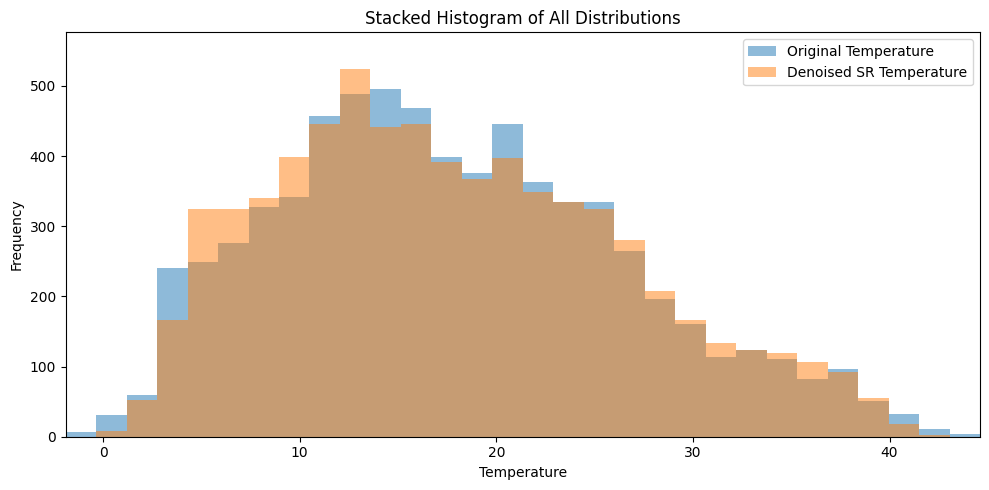

In [5]:
X_aux = X[:, [0, 2]]
y_denoised_sr = candidate_function(X_aux)
# y_denoised_sr = candidate_function(X)
plot_histograms([(y, 'Original Temperature', None), (y_denoised_sr, 'Denoised SR Temperature', None)], 'Temperature', stack=True, figsize_per_plot=(10, 5))

In [7]:
kscomplement_score = KSComplement.compute(
    real_data=y,
    synthetic_data=y_denoised_sr
)
print(f'KSComplement Score = {round(kscomplement_score * 100, 2)}%')

KSComplement Score = 98.23%


<Figure size 640x480 with 0 Axes>

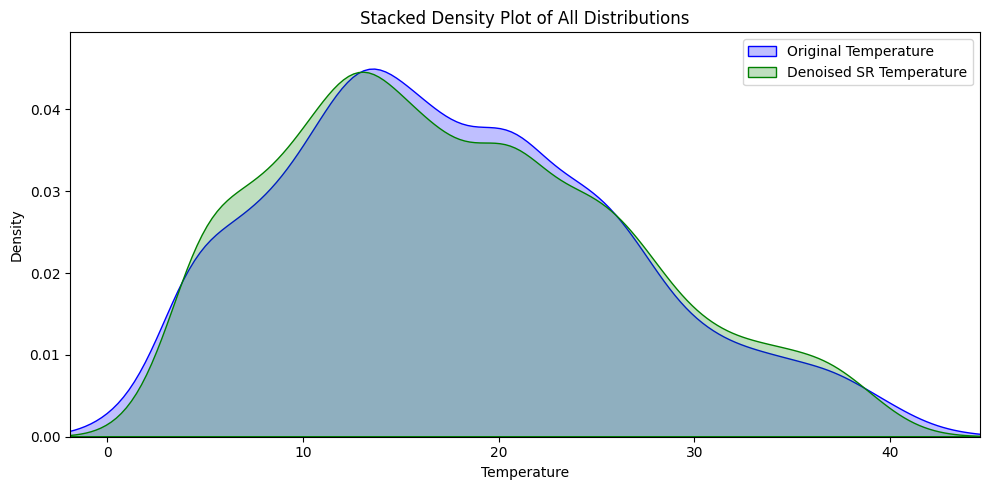

In [8]:
plot_densities([(y, 'Original Temperature', 'blue'), (y_denoised_sr, 'Denoised SR Temperature', 'green')], 'Temperature', stack=True, figsize_per_plot=(10, 5))

In [9]:
orig_residuals = y - y_denoised_sr

In [10]:
y_corrected, best_amp, errors, _ = correct_predictions(y, y_denoised_sr, method='stratified', seed=42, clip_lower=0, clip_upper=None, original_residuals=None, tail_replace=True, lower_percentile=50)
# ignore error in orig_residuals after first run

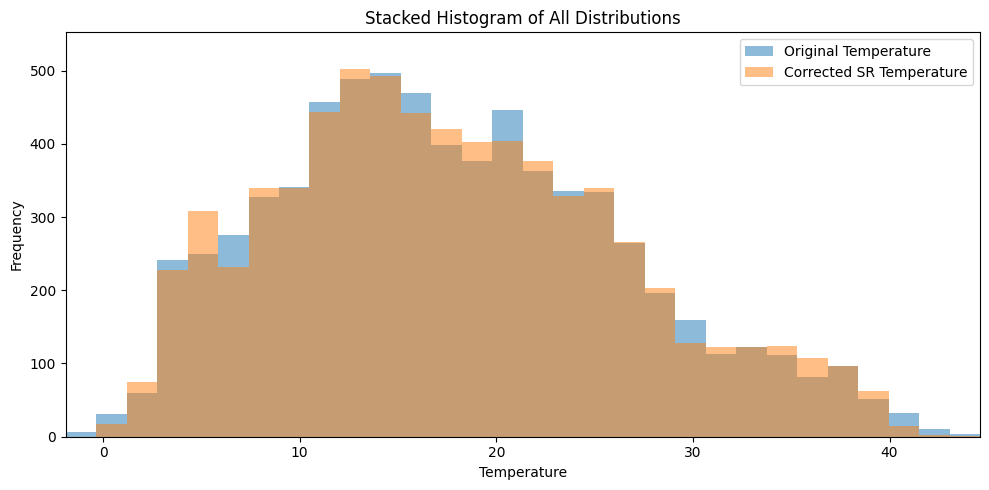

In [11]:
plot_histograms([(y, 'Original Temperature', None), (y_corrected, 'Corrected SR Temperature', None)], 'Temperature', stack=True, figsize_per_plot=(10, 5))

In [12]:
kscomplement_score = KSComplement.compute(
    real_data=y,
    synthetic_data=y_corrected
)
print(f'KSComplement Score = {round(kscomplement_score * 100, 2)}%')

KSComplement Score = 99.15%


<Figure size 640x480 with 0 Axes>

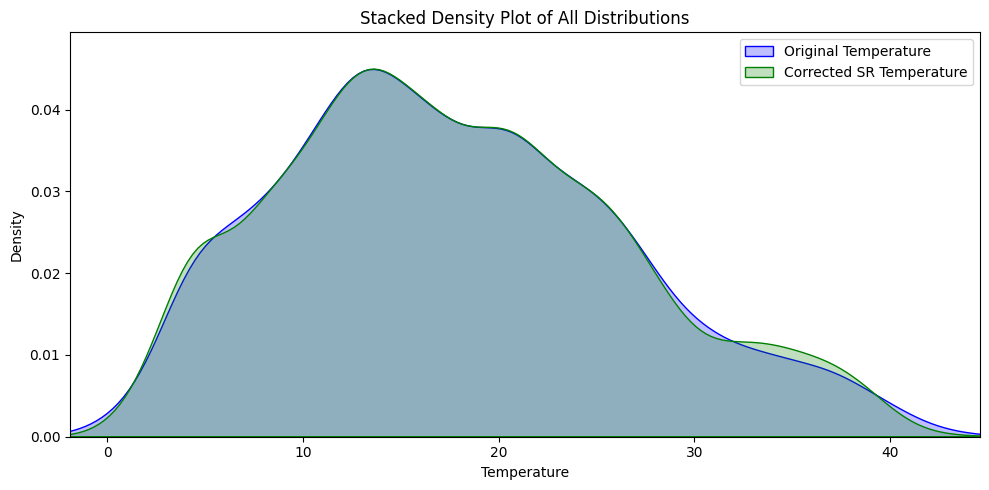

In [13]:
plot_densities([(y, 'Original Temperature', 'blue'), (y_corrected, 'Corrected SR Temperature', 'green')], 'Temperature', stack=True, figsize_per_plot=(10, 5))

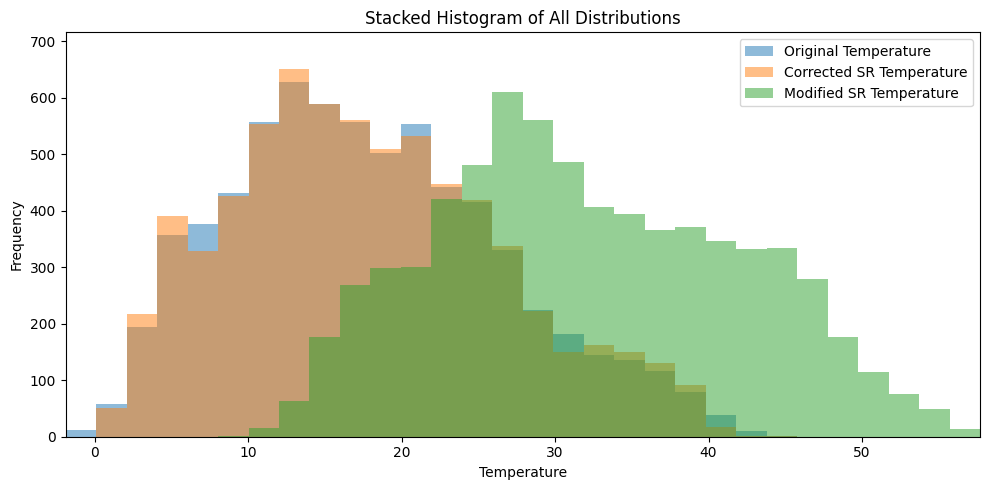

In [14]:
mod_candidate_function = generate_candidate_function("(2390.1536 / ((x2 / 2*x0) + 34.04592)) + -10.908732")
mod_y_sr = mod_candidate_function(X_aux)
mod_y_corrected, best_amp, errors, _ = correct_predictions(y, mod_y_sr, method='stratified', amplification_factor=1.0, seed=42, clip_lower=0, clip_upper=None, original_residuals=orig_residuals, tail_replace=True, lower_percentile=50)
# ignore error in orig_residuals after first run
plot_histograms([(y, 'Original Temperature', None), (y_corrected, 'Corrected SR Temperature', None), (mod_y_corrected, 'Modified SR Temperature', None)], 'Temperature', stack=True, figsize_per_plot=(10, 5))